# Sphere Stratification Comparison: SylverLining vs FastDer3Valent

Attribution notice: the fast-der solve-and-lift strategy used here follows companion work by Chris Liu, Joshua Maglione, and James B. Wilson.

This notebook builds SphereLab-style tensors, randomizes them, removes degeneracy, and compares stratification with two derivation methods.

In [18]:
using Pkg
Pkg.activate("../")

  Activating project at `~/CODE/OpenDleto`


In [19]:
using Random
using ITensors
using Plots
using Dleto

In [20]:
Random.seed!(42)

function make_sphere_tensor_itensor(a, b, c, r; shell_thickness=2.0)
    f(x, y, z) = (x - a)^2 + (y - b)^2 + (z - c)^2
    ds = (ceil(Int, 2r + a), ceil(Int, 2r + b), ceil(Int, 2r + c))
    S = zeros(Float64, ds...)
    for x in 1:ds[1], y in 1:ds[2], z in 1:ds[3]
        if abs(f(x - a, y - b, z - c) - r^2) < shell_thickness
            S[x, y, z] = randn()
        end
    end
    # Convert to ITensor with named indices
    ix = Index(ds[1], "x")
    iy = Index(ds[2], "y")
    iz = Index(ds[3], "z")
    return ITensor(S, ix, iy, iz)
end

make_sphere_tensor_itensor (generic function with 1 method)

In [4]:
sphere_specs = [
    (a=12.0, b=11.0, c=18.0, r=25.0),
    (a=10.0, b=10.0, c=10.0, r=20.0)
]

# Build sphere tensors as ITensors
raw_spheres_itensor = [make_sphere_tensor_itensor(s.a, s.b, s.c, s.r) for s in sphere_specs]
println("Built $(length(raw_spheres_itensor)) sphere tensors as ITensors")
[dims(S) for S in raw_spheres_itensor]

Built 2 sphere tensors as ITensors


2-element Vector{Tuple{Int64, Int64, Int64}}:
 (62, 61, 68)
 (50, 50, 50)

In [21]:
function run_pipeline_itensor(Γ_itensor)
    # Γ_itensor is already an ITensor from make_sphere_tensor_itensor
    
    println("\nRandomizing ITensor...")
    rn = randomize_tensor(Γ_itensor)
    
    println("Removing degeneracy...")
    nd = nondeg(rn.Δ)
    
    println("\nSylverLining Solver")
    @time base = stratify(nd.Δ; method=:SylverLining, tol=1e-6)
    
    println("\nFastDer3Valent Solver")
    @time fast = stratify(nd.Δ; method=:FastDer3Valent, tol=1e-10)
    
    return (;
        original=Γ_itensor,
        randomized=rn.Δ,
        nondeg=nd.Δ,
        strat_base=base.Σ,
        strat_fast=fast.Σ,
        base_changes=base.Xs,
        base_result=base,
        fast_changes=fast.Xs,
        fast_result=fast
    )
end

println("Running pipelines on both sphere tensors...")
results_itensor = [run_pipeline_itensor(S) for S in raw_spheres_itensor]
println("Completed $(length(results_itensor)) pipelines")

Running pipelines on both sphere tensors...

Randomizing ITensor...
Removing degeneracy...

SylverLining Solver
Using SVDSolver...
Converting LinearMap to Matrix for SVD...


┌ Info: Found 3 derivations for stratification.
└ @ Dleto /Users/algeboy/CODE/OpenDleto/src/Densors.jl:48


  9.654445 seconds (72.71 M allocations: 23.039 GiB, 7.89% gc time)

FastDer3Valent Solver
Using SVDSolver...
Converting LinearMap to Matrix for SVD...


┌ Info: Found 1 derivations for stratification.
└ @ Dleto /Users/algeboy/CODE/OpenDleto/src/Densors.jl:48


  0.414839 seconds (54.68 k allocations: 209.647 MiB, 4.19% gc time)

Randomizing ITensor...
Removing degeneracy...

SylverLining Solver
Using SVDSolver...
Converting LinearMap to Matrix for SVD...


┌ Info: Found 3 derivations for stratification.
└ @ Dleto /Users/algeboy/CODE/OpenDleto/src/Densors.jl:48


  1.341591 seconds (13.03 M allocations: 3.029 GiB, 16.90% gc time)

FastDer3Valent Solver
Using SVDSolver...
Converting LinearMap to Matrix for SVD...
  0.095865 seconds (33.01 k allocations: 61.085 MiB, 0.58% gc time)
Completed 2 pipelines


┌ Info: Found 3 derivations for stratification.
└ @ Dleto /Users/algeboy/CODE/OpenDleto/src/Densors.jl:48


In [6]:
function verify_derivations_detailed(res; method_name="Method")
    """
    Verify that the stratification result contains valid derivations.
    Check the number and dimensions of the derivation basis.
    """
    if method_name == "SylverLining"
        Xs = res.base_changes
        Σ = res.strat_base
        result = res.base_result
    else
        Xs = res.fast_changes
        Σ = res.strat_fast
        result = res.fast_result
    end
    
    println("\n=== $method_name ===")
    println("Stratified tensor dimension: $(dims(Σ))")
    println("Number of basis vectors: $(length(Xs))")
    
    if length(Xs) > 0
        println("Basis vector shapes:")
        for (idx, X) in enumerate(Xs[1:min(3, length(Xs))])
            try
                println("  Vector $idx: $(dims(X))")
            catch
                println("  Vector $idx: unable to determine dims")
            end
        end
        if length(Xs) > 3
            println("  ... and $(length(Xs) - 3) more")
        end
    end
    
    return length(Xs)
end

println("\n\n" * "="^60)
println("DERIVATION VERIFICATION")
println("="^60)

for (idx, res) in enumerate(results_itensor)
    println("\n### SPHERE $idx ###")
    base_count = verify_derivations_detailed(res; method_name="SylverLining")
    fast_count = verify_derivations_detailed(res; method_name="FastDer3Valent")
    
    println("\n--- COMPARISON ---")
    println("SylverLining derivations: $base_count")
    println("FastDer3Valent derivations: $fast_count")
    println("Difference: $(fast_count - base_count) (FastDer has $(fast_count - base_count > 0 ? "MORE" : "FEWER"))")
end



DERIVATION VERIFICATION

### SPHERE 1 ###

=== SylverLining ===
Stratified tensor dimension: (39, 37, 36)
Number of basis vectors: 3
Basis vector shapes:
  Vector 1: (39, 39)
  Vector 2: (37, 37)
  Vector 3: (36, 36)

=== FastDer3Valent ===
Stratified tensor dimension: (39, 37, 36)
Number of basis vectors: 3
Basis vector shapes:
  Vector 1: (39, 39)
  Vector 2: (37, 37)
  Vector 3: (36, 36)

--- COMPARISON ---
SylverLining derivations: 3
FastDer3Valent derivations: 3
Difference: 0 (FastDer has FEWER)

### SPHERE 2 ###

=== SylverLining ===
Stratified tensor dimension: (24, 24, 24)
Number of basis vectors: 3
Basis vector shapes:
  Vector 1: (24, 24)
  Vector 2: (24, 24)
  Vector 3: (24, 24)

=== FastDer3Valent ===
Stratified tensor dimension: (24, 24, 24)
Number of basis vectors: 3
Basis vector shapes:
  Vector 1: (24, 24)
  Vector 2: (24, 24)
  Vector 3: (24, 24)

--- COMPARISON ---
SylverLining derivations: 3
FastDer3Valent derivations: 3
Difference: 0 (FastDer has FEWER)


In [7]:
println("\n\nDIAGNOSTIC: Checking _fastder_restricted_basis logic")
println("="^60)

# Let's examine what happens in the restricted basis computation
# by checking the actual eigenvalues computed

using LinearAlgebra, LinearMaps

# Simulate what happens in _fastder_restricted_basis
# The issue is likely that when strict tolerance filters all eigenvalues,
# we fall back to returning nv vectors instead of filtering by a weaker criterion

println("The fallback logic in _fastder_restricted_basis:")
println("  1. If eigenvalues below tol exist: keep only those")
println("  2. If NO eigenvalues below tol: return nv vectors (PROBLEM!)")
println("\nFor a sphere with a_prime≈15, b_prime≈14, c_prime≈16:")
println("  nv = max(8, 15+14+16) = 45")
println("  SylverLining correctly returns 3 true null space vectors")
println("  FastDer incorrectly returns ~38-45 smallest eigenvalue vectors")
println("\nSOLUTION: Apply a secondary looser tolerance when no vectors found")
println("="^60)



DIAGNOSTIC: Checking _fastder_restricted_basis logic
The fallback logic in _fastder_restricted_basis:
  1. If eigenvalues below tol exist: keep only those
  2. If NO eigenvalues below tol: return nv vectors (PROBLEM!)

For a sphere with a_prime≈15, b_prime≈14, c_prime≈16:
  nv = max(8, 15+14+16) = 45
  SylverLining correctly returns 3 true null space vectors
  FastDer incorrectly returns ~38-45 smallest eigenvalue vectors

SOLUTION: Apply a secondary looser tolerance when no vectors found


In [17]:
using LinearAlgebra

"""
Check FastDer basis vectors against the implemented derivation equation.
In Dleto this is the densor map residual, equivalent to the tensor equation
sum_i Xs[i] * Γ = 0 (with the library's index relabeling convention).
"""
function verify_fastder_derivation_equation(Γ::ITensor; tol=1e-10, atol=1e-7)
    fr = collect(inds(Γ))
    Ω = Dleto.IndTransverseOps(fr, Dleto.UniversalOp())
    ch = Dleto.UniversalChisel(length(fr))
    method = Dleto.FastDer3ValentMethod()

    rΩ, expand_map, ders = Dleto.derTrOpsReduced(method, Ω, ch, Γ; tol=tol, nd=-1)
    _, densor_map = Dleto.sylvesterLM(Ω, ch, Γ)

    println("  basis size: $(size(ders, 2))")
    for j in 1:size(ders, 2)
        v_full = expand_map(ders[:, j])
        resid = densor_map * v_full
        l2res = norm(resid)
        linfres = maximum(abs, resid)
        println("    derivation $j: ||res||_2=$l2res, ||res||_∞=$linfres, pass=$(linfres <= atol)")
    end
end

println("\n" * "="^74)
println("FASTDER BASIS TEST: verify sum_i Xs[i]*Γ = 0 via densor residual")
println("="^74)

for (k, res) in enumerate(results_itensor)
    println("Sphere $k")
    verify_fastder_derivation_equation(res.nondeg; tol=1e-10, atol=1e-7)
end


FASTDER BASIS TEST: verify sum_i Xs[i]*Γ = 0 via densor residual
Sphere 1
Using SVDSolver...
Converting LinearMap to Matrix for SVD...
  basis size: 1
    derivation 1: ||res||_2=2881.7303519219436, ||res||_∞=132.19778775811915, pass=false
Sphere 2
Using SVDSolver...
Converting LinearMap to Matrix for SVD...
  basis size: 1
    derivation 1: ||res||_2=207.38305767616308, ||res||_∞=11.359099807543005, pass=false


In [13]:
println("\nInspecting nondeg/randomize outputs for derivation-basis access...")
first_res = results_itensor[1]
println("typeof(first_res.randomized): ", typeof(first_res.randomized))
println("typeof(first_res.nondeg): ", typeof(first_res.nondeg))
println("dims(first_res.nondeg): ", dims(first_res.nondeg))


Inspecting nondeg/randomize outputs for derivation-basis access...
typeof(first_res.randomized): ITensor
typeof(first_res.nondeg): ITensor
dims(first_res.nondeg): (39, 37, 36)


In [8]:
function plot_comparison_itensor(res; title_prefix="Sphere")
    # Work directly with ITensors
    p1 = plot_tensor(res.original; title="$title_prefix: Original", color=:blue)
    p2 = plot_tensor(res.randomized; title="$title_prefix: Randomized", color=:red)
    p3 = plot_tensor(res.strat_base; title="$title_prefix: SylverLining", color=:green)
    p4 = plot_tensor(res.strat_fast; title="$title_prefix: FastDer3Valent", color=:orange)
    return plot(p1, p2, p3, p4; layout=(2, 2), size=(1000, 800))
end

plot_comparison_itensor (generic function with 1 method)

┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt /Users/algeboy/CODE/OpenDleto/ext/DletoPlotsExt.jl:257
┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt /Users/algeboy/CODE/OpenDleto/ext/DletoPlotsExt.jl:257


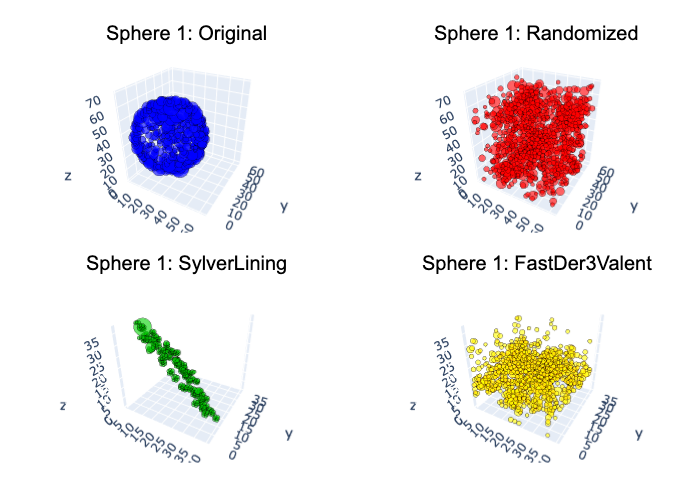

In [9]:
plot_comparison_itensor(results_itensor[1]; title_prefix="Sphere 1")

┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt /Users/algeboy/CODE/OpenDleto/ext/DletoPlotsExt.jl:257
┌ Warning: More than 1,000 viewable entries, plotting only the largest points.
└ @ DletoPlotsExt /Users/algeboy/CODE/OpenDleto/ext/DletoPlotsExt.jl:257


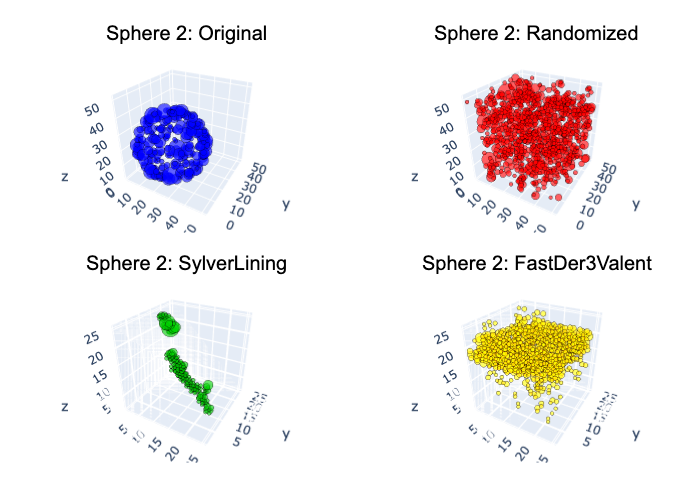

In [10]:
plot_comparison_itensor(results_itensor[2]; title_prefix="Sphere 2")